In [1]:
!apt-get update -qq
!apt-get install -y xvfb python3-opengl ffmpeg swig -qq

!pip install -q swig
!pip install -q box2d-py
!pip install -q gymnasium[box2d] --no-build-isolation

!pip install -q stable-baselines3[extra]
!pip install -q pyvirtualdisplay imageio imageio-ffmpeg matplotlib pillow

print("✅ All dependencies installed!")

W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)
Selecting previously unselected package freeglut3:amd64.
(Reading database ... 122402 files and directories currently installed.)
Preparing to unpack .../freeglut3_2.8.1-6_amd64.deb ...
Unpacking freeglut3:amd64 (2.8.1-6) ...
Selecting previously unselected package libglu1-mesa:amd64.
Preparing to unpack .../libglu1-mesa_9.0.2-1_amd64.deb ...
Unpacking libglu1-mesa:amd64 (9.0.2-1) ...
Selecting previously unselected package python3-opengl.
Preparing to unpack .../python3-opengl_3.1.5+dfsg-1_all.deb ...
Unpacking python3-opengl (3.1.5+dfsg-1) ...
Selecting previously unselected package swig4.0.
Preparing to unpack .../swig4.0_4.0.2-1ubuntu1_amd64.deb ...
Unpacking swig4.0 (4.0.2-1ubuntu1) ...
Selecting previously unselected package swig.
Preparing to unpack .../swig_4.0.2-1ubuntu1_all.deb ...
Unpackin

In [2]:
import gymnasium as gym
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import imageio
import os
import subprocess
from PIL import Image as PILImage, ImageDraw
from stable_baselines3 import PPO
from stable_baselines3.common.monitor import Monitor
from stable_baselines3.common.vec_env import DummyVecEnv, VecNormalize
from stable_baselines3.common.evaluation import evaluate_policy
from stable_baselines3.common.callbacks import BaseCallback, EvalCallback, CallbackList
from pyvirtualdisplay import Display
from IPython.display import Image, Video, display as ipy_display, HTML

vdisplay = Display(visible=0, size=(1400, 900))
vdisplay.start()

reward_log = {
    "phases":       [],
    "mean_rewards": [],
    "std_rewards":  [],
    "gif_paths":    [],
    "mp4_paths":    [],
}

print(" Virtual display started!")
print(" Libraries imported!")

Gym has been unmaintained since 2022 and does not support NumPy 2.0 amongst other critical functionality.
Please upgrade to Gymnasium, the maintained drop-in replacement of Gym, or contact the authors of your software and request that they upgrade.
See the migration guide at https://gymnasium.farama.org/introduction/migration_guide/ for additional information.
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


 Virtual display started!
 Libraries imported!


In [3]:
class LiveRewardCallback(BaseCallback):
    """
    Logs episode rewards and timesteps during training.
    Access via:  callback.ep_rewards  /  callback.ep_timesteps
    """
    def __init__(self, verbose=0):
        super().__init__(verbose)
        self.ep_rewards    = []
        self.ep_timesteps  = []

    def _on_step(self) -> bool:
        for info in self.locals.get("infos", []):
            if "episode" in info:
                self.ep_rewards.append(info["episode"]["r"])
                self.ep_timesteps.append(self.num_timesteps)
        return True

def make_env():
    env = gym.make("BipedalWalker-v3")
    env = Monitor(env)
    return env

def add_overlay(frame, label, reward=None, failed=False):
    img  = PILImage.fromarray(frame)
    draw = ImageDraw.Draw(img)
    W, H = img.size

    banner_col = (160, 20, 20) if failed else (15, 15, 15)
    draw.rectangle([0, 0, W, 36], fill=(*banner_col, 220))
    draw.text((10, 9), label, fill=(255, 255, 255))

    if reward is not None:
        badge_col  = (200, 50, 50) if failed else (30, 150, 80)
        badge_text = f"Reward: {reward:+.1f}"
        draw.rectangle([W - 160, 5, W - 5, 31], fill=badge_col)
        draw.text((W - 155, 10), badge_text, fill=(255, 255, 255))

    if failed:
        draw.rectangle([0, H//2 - 30, W, H//2 + 30], fill=(160, 10, 10, 210))
        draw.text((W//2 - 140, H//2 - 10),
                  "⚠  AGENT FAILED — LEG REMOVED",
                  fill=(255, 220, 50))

    return np.array(img)

def record_gif(model, gif_path, label,
               steps=1600, chaos=False, chaos_step=120,
               obs_rms=None):
    video_env = gym.make("BipedalWalker-v3", render_mode="rgb_array")
    obs, _    = video_env.reset()
    frames    = []
    ep_reward = 0.0
    failed    = False

    for step_i in range(steps):
        frame = video_env.render()

        if chaos and step_i == chaos_step:
            failed = True
            print(f"   LEG REMOVED at step {step_i}!")

        banner = "⚠ CHAOS — Leg Disabled" if (chaos and step_i >= chaos_step) else label
        annotated = add_overlay(frame, banner,
                                reward=ep_reward,
                                failed=(failed and step_i > chaos_step))
        frames.append(annotated)

        if obs_rms is not None:
            obs_in = np.clip(
                (obs - obs_rms.mean) / np.sqrt(obs_rms.var + 1e-8),
                -10.0, 10.0
            )[np.newaxis]
            action, _ = model.predict(obs_in, deterministic=True)
            action = action[0]
        else:
            action, _ = model.predict(obs, deterministic=True)

        if chaos and step_i >= chaos_step:
            action = action.copy()
            action[0] = 0.0
            action[1] = 0.0

        obs, reward, terminated, truncated, _ = video_env.step(action)
        ep_reward += reward

        if terminated or truncated:
            for _ in range(20):
                frames.append(annotated)
            break

    video_env.close()
    imageio.mimsave(gif_path, frames, fps=30)
    print(f"   GIF  → {gif_path}   |  reward: {ep_reward:.1f}")
    return gif_path, ep_reward

def record_mp4(model, mp4_path, label,
               steps=2000, obs_rms=None):
    video_env = gym.make("BipedalWalker-v3", render_mode="rgb_array")
    obs, _    = video_env.reset()
    frames    = []
    ep_reward = 0.0

    for _ in range(steps):
        frame     = video_env.render()
        annotated = add_overlay(frame, label, reward=ep_reward)
        frames.append(annotated)

        if obs_rms is not None:
            obs_in = np.clip(
                (obs - obs_rms.mean) / np.sqrt(obs_rms.var + 1e-8),
                -10.0, 10.0
            )[np.newaxis]
            action, _ = model.predict(obs_in, deterministic=True)
            action = action[0]
        else:
            action, _ = model.predict(obs, deterministic=True)

        obs, reward, terminated, truncated, _ = video_env.step(action)
        ep_reward += reward

        if terminated or truncated:
            for _ in range(30):
                frames.append(annotated)
            break

    video_env.close()
    imageio.mimwrite(mp4_path, frames, fps=30,
                     quality=8, macro_block_size=1)
    print(f"   MP4  → {mp4_path}   |  reward: {ep_reward:.1f}")
    return mp4_path, ep_reward

def plot_reward_curve(ep_rewards, ep_timesteps,
                      title="Training reward curve",
                      save_path="reward_curve.png"):
    if not ep_rewards:
        print("   (no episode data to plot)")
        return

    window   = max(1, len(ep_rewards) // 20)
    smoothed = np.convolve(ep_rewards,
                           np.ones(window) / window, mode="valid")
    ts_raw   = ep_timesteps
    ts_sm    = ep_timesteps[window - 1 : len(ep_rewards)]

    fig, ax = plt.subplots(figsize=(12, 5))
    fig.patch.set_facecolor("#0D0D0D")
    ax.set_facecolor("#0D0D0D")

    ax.plot(ts_raw, ep_rewards,
            alpha=0.25, color="#4A90D9", linewidth=0.8, label="Raw reward")
    ax.plot(ts_sm,  smoothed,
            color="#4A90D9", linewidth=2.5,  label=f"Smoothed (window={window})")
    ax.axhline(300,  color="#F1C40F", linestyle="--",
               linewidth=1.2, label="Solved (300)")
    ax.axhline(0,    color="white",  linestyle=":",
               linewidth=0.5, alpha=0.3)

    ax.set_xlabel("Timesteps", color="white", fontsize=12)
    ax.set_ylabel("Episode Reward", color="white", fontsize=12)
    ax.set_title(title, color="white", fontsize=14,
                 fontweight="bold", pad=10)
    ax.tick_params(colors="white")
    for spine in ax.spines.values():
        spine.set_edgecolor("#444")
    ax.legend(facecolor="#1A1A1A", labelcolor="white", fontsize=10)

    plt.tight_layout()
    plt.savefig(save_path, dpi=150, bbox_inches="tight",
                facecolor="#0D0D0D")
    plt.show()
    print(f"   Reward curve saved → {save_path}")


print("✅ All utilities ready!")

✅ All utilities ready!


In [ ]:
train_env = DummyVecEnv([make_env])

train_env = VecNormalize(train_env,
                         norm_obs=True, norm_reward=True,
                         clip_obs=10.0)

eval_env  = DummyVecEnv([make_env])
eval_env  = VecNormalize(eval_env,
                         norm_obs=True, norm_reward=False,
                         clip_obs=10.0)
eval_env.training = False

model = PPO(
    "MlpPolicy",
    train_env,
    learning_rate  = 3e-4,
    n_steps        = 2048,
    batch_size     = 64,
    n_epochs       = 10,
    gamma          = 0.99,
    gae_lambda     = 0.95,
    clip_range     = 0.2,
    ent_coef       = 0.001,
    vf_coef        = 0.5,
    max_grad_norm  = 0.5,
    policy_kwargs  = dict(net_arch=dict(pi=[256, 256], vf=[256, 256])),
    verbose        = 0,
    device         = "auto",
    tensorboard_log= "./tb_logs/",
)

print(" PPO model created!")
print(f"   Network : pi=[256,256]  vf=[256,256]")
print(f"   Device  : {model.device}")
print()

print(" Phase 0 — Untrained baseline...")
obs_rms = train_env.obs_rms

record_gif(model,
           gif_path="phase_0_untrained.gif",
           label="Phase 0 — Untrained (0 steps)",
           obs_rms=obs_rms)

record_mp4(model,
           mp4_path="phase_0_untrained.mp4",
           label="Phase 0 — Untrained (0 steps)",
           obs_rms=obs_rms)

mean_r, std_r = evaluate_policy(model, eval_env, n_eval_episodes=5)
reward_log["phases"].append("Untrained")
reward_log["mean_rewards"].append(mean_r)
reward_log["std_rewards"].append(std_r)
reward_log["gif_paths"].append("phase_0_untrained.gif")
reward_log["mp4_paths"].append("phase_0_untrained.mp4")

print(f"\n📊 Phase 0 — Mean: {mean_r:.1f} ± {std_r:.1f}")
ipy_display(Image(filename="phase_0_untrained.gif"))

In [ ]:
training_schedule = [
    (50_000,   "50K steps",  "phase_1_50k.gif"),
    (50_000,   "100K steps", "phase_2_100k.gif"),
    (900_000,  "1M steps",   "phase_3_1m.gif"),
]

cumulative_steps = 0

for extra_steps, cum_label, gif_name in training_schedule:
    cumulative_steps += extra_steps

    reward_cb = LiveRewardCallback()
    eval_cb = EvalCallback(
        eval_env,
        best_model_save_path="./best_model/",
        log_path            ="./eval_logs/",
        eval_freq           = 10_000,
        n_eval_episodes     = 5,
        deterministic       = True,
        render              = False,
        verbose             = 0,
    )

    print(f"\n{'─'*55}")
    print(f"🚀 Training to {cumulative_steps:,} total timesteps...")
    print(f"{'─'*55}")

    model.learn(
        total_timesteps    = extra_steps,
        reset_num_timesteps= False,
        callback           = CallbackList([reward_cb, eval_cb]),
    )

    eval_env.obs_rms = train_env.obs_rms
    mean_r, std_r = evaluate_policy(model, eval_env, n_eval_episodes=5)
    reward_log["phases"].append(cum_label)
    reward_log["mean_rewards"].append(mean_r)
    reward_log["std_rewards"].append(std_r)
    reward_log["gif_paths"].append(gif_name)

    solved = " SOLVED!" if mean_r >= 300 else "Not yet"
    print(f"📊 {cum_label} — Reward: {mean_r:.1f} ± {std_r:.1f}  {solved}")

    obs_rms = train_env.obs_rms
    label   = f"{cum_label} | Reward: {mean_r:.0f}"

    print(f" Recording GIF...")
    record_gif(model, gif_name, label, obs_rms=obs_rms)

    print(f" Agent at {cum_label}:")
    ipy_display(Image(filename=gif_name))

model.save("bipedal_ppo_1m")
train_env.save("vec_normalize.pkl")
print("\n Model + normalisation stats saved!")

 Recording Chaos GIF...
   LEG REMOVED at step 120!
   GIF  → phase_chaos.gif   |  reward: 8.0
Chaos GIF ready!


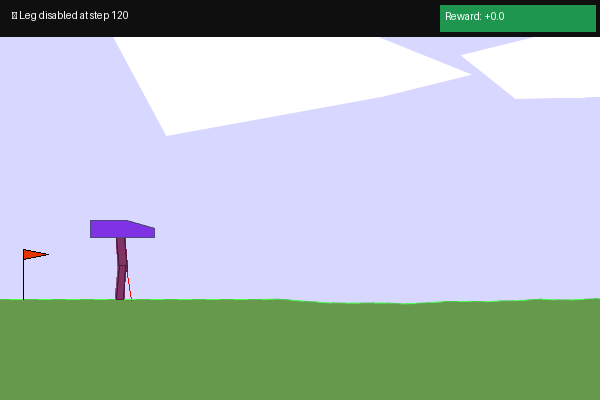

In [7]:
obs_rms = train_env.obs_rms

print(" Recording Chaos GIF...")
record_gif(
    model,
    gif_path  = "phase_chaos.gif",
    label     = " — Leg disabled at step 120",
    chaos     = True,
    chaos_step= 120,
    steps     = 350,
    obs_rms   = obs_rms
)

print("Chaos GIF ready!")
ipy_display(Image(filename="phase_chaos.gif"))

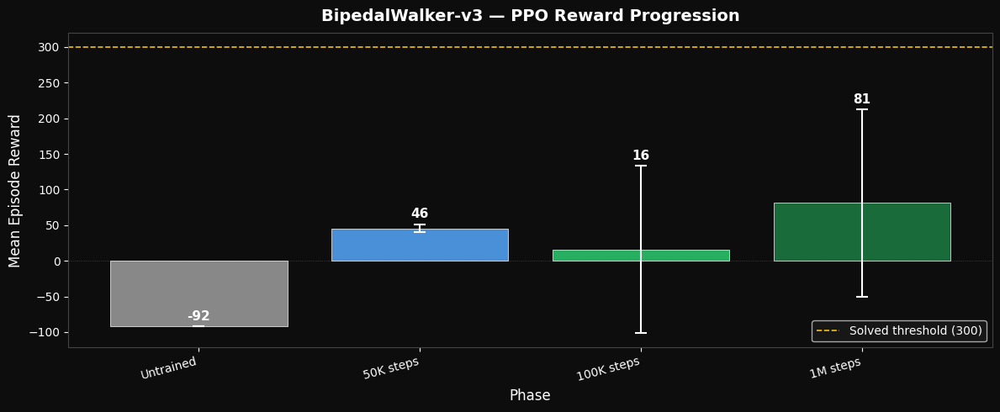

Phase,Mean Reward,Status
Untrained,-92,Falls immediately
50K steps,46,"Wiggles, no gait"
100K steps,16,Some forward motion
1M steps,81,Walking — needs more time
Chaos (leg off),FAILED,No recovery — falls



──  Untrained ──────────────────────────────────


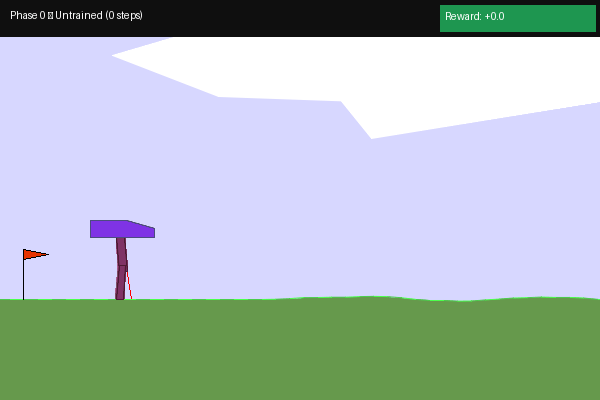


──  50K steps ──────────────────────────────────


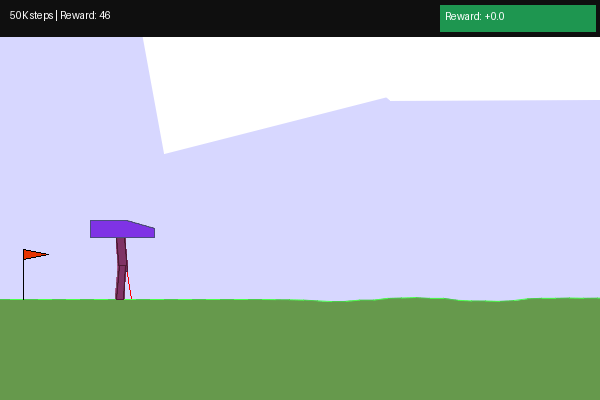


──  100K steps ──────────────────────────────────


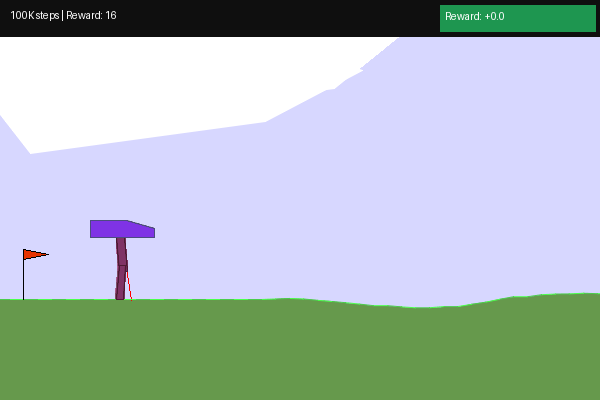


──  1M steps ──────────────────────────────────


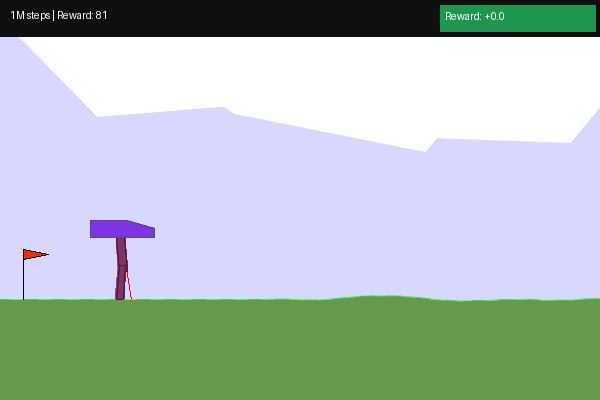


──   Chaos ──────────────────────────────────


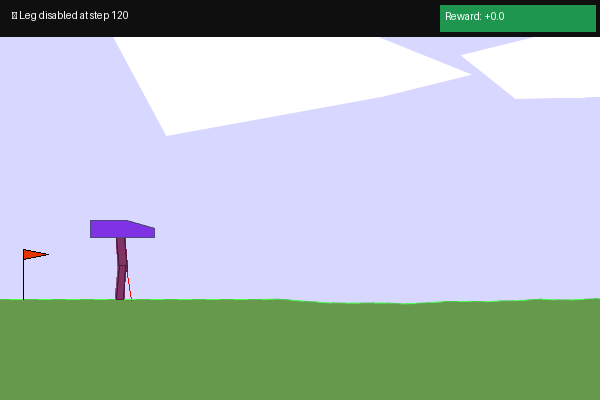


 Project complete!


In [8]:
phases = reward_log["phases"]
means  = reward_log["mean_rewards"]
stds   = reward_log["std_rewards"]

bar_colors = ["#888888", "#4A90D9", "#27AE60", "#1A6B3A", "#C0392B"][:len(phases)]

fig, ax = plt.subplots(figsize=(12, 5))
fig.patch.set_facecolor("#0D0D0D")
ax.set_facecolor("#0D0D0D")

bars = ax.bar(phases, means, yerr=stds, capsize=5,
              color=bar_colors, edgecolor="white", linewidth=0.5,
              error_kw=dict(ecolor="white", lw=1.5, capthick=1.5))

for bar, m, s in zip(bars, means, stds):
    h = bar.get_height()
    ax.text(bar.get_x() + bar.get_width() / 2,
            h + abs(s) + 5, f"{m:.0f}",
            ha="center", va="bottom",
            color="white", fontsize=11, fontweight="bold")

ax.axhline(300, color="#F1C40F", linestyle="--",
           linewidth=1.2, label="Solved threshold (300)")
ax.axhline(0, color="white", linestyle=":", linewidth=0.5, alpha=0.3)
ax.set_xlabel("Phase", color="white", fontsize=12)
ax.set_ylabel("Mean Episode Reward", color="white", fontsize=12)
ax.set_title("BipedalWalker-v3 — PPO Reward Progression",
             color="white", fontsize=14, fontweight="bold", pad=10)
ax.tick_params(colors="white")
for sp in ax.spines.values():
    sp.set_edgecolor("#444")
ax.legend(facecolor="#1A1A1A", labelcolor="white", fontsize=10)
plt.xticks(rotation=15, ha="right")
plt.tight_layout()
plt.savefig("reward_bar_chart.png", dpi=150,
            bbox_inches="tight", facecolor="#0D0D0D")
plt.show()

ipy_display(HTML(f"""
<div style="background:#111;color:white;font-family:monospace;
            border-radius:10px;overflow:hidden;margin:12px 0">
  <div style="background:#1a1a2e;padding:10px 16px;font-size:15px;
              font-weight:bold">
     BEFORE / AFTER / CHAOS — Summary
  </div>
  <table style="width:100%;border-collapse:collapse;font-size:13px">
    <tr style="background:#222">
      <th style="padding:8px 14px;text-align:left">Phase</th>
      <th style="padding:8px 14px;text-align:center">Mean Reward</th>
      <th style="padding:8px 14px;text-align:center">Status</th>
    </tr>
    <tr>
      <td style="padding:8px 14px"> Untrained</td>
      <td style="padding:8px 14px;text-align:center;color:#FF6B6B">{means[0]:.0f}</td>
      <td style="padding:8px 14px;text-align:center">Falls immediately</td>
    </tr>
    <tr style="background:#1a1a1a">
      <td style="padding:8px 14px"> 50K steps</td>
      <td style="padding:8px 14px;text-align:center;color:#FFD700">{means[1]:.0f}</td>
      <td style="padding:8px 14px;text-align:center">Wiggles, no gait</td>
    </tr>
    <tr>
      <td style="padding:8px 14px"> 100K steps</td>
      <td style="padding:8px 14px;text-align:center;color:#FFA040">{means[2]:.0f}</td>
      <td style="padding:8px 14px;text-align:center">Some forward motion</td>
    </tr>
    <tr style="background:#1a1a1a">
      <td style="padding:8px 14px"> 1M steps</td>
      <td style="padding:8px 14px;text-align:center;color:#6BFF8E">{means[3]:.0f}</td>
      <td style="padding:8px 14px;text-align:center">
        {" Solved!" if means[3] >= 300 else "Walking — needs more time"}</td>
    </tr>
    <tr>
      <td style="padding:8px 14px"> Chaos (leg off)</td>
      <td style="padding:8px 14px;text-align:center;color:#FF4444">FAILED</td>
      <td style="padding:8px 14px;text-align:center">No recovery — falls</td>
    </tr>
  </table>
</div>
"""))

for label, path in [
    (" Untrained",  "phase_0_untrained.gif"),
    (" 50K steps",  "phase_1_50k.gif"),
    (" 100K steps", "phase_2_100k.gif"),
    (" 1M steps",   "phase_3_1m.gif"),
    ("  Chaos",      "phase_chaos.gif"),
]:
    print(f"\n── {label} ──────────────────────────────────")
    ipy_display(Image(filename=path))

print("\n Project complete!")